# Data loading

In [1]:
import os
import json
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms
from torchvision.transforms import functional as TF
from torchvision.utils import save_image
from tqdm import tqdm
from PIL import Image, ImageDraw
import cv2
import random
import albumentations as A
from albumentations import Compose, Resize, Rotate, HorizontalFlip, VerticalFlip, Normalize
from albumentations.pytorch import ToTensorV2
from albumentations.augmentations.transforms import CLAHE

Sample 0, Augment 0: img shape = (224, 224), mask shape = (224, 224)
Sample 0, Augment 1: img shape = (224, 224), mask shape = (224, 224)
Sample 0, Augment 2: img shape = (224, 224), mask shape = (224, 224)
Sample 0, Augment 3: img shape = (224, 224), mask shape = (224, 224)
Sample 0, Augment 4: img shape = (224, 224), mask shape = (224, 224)


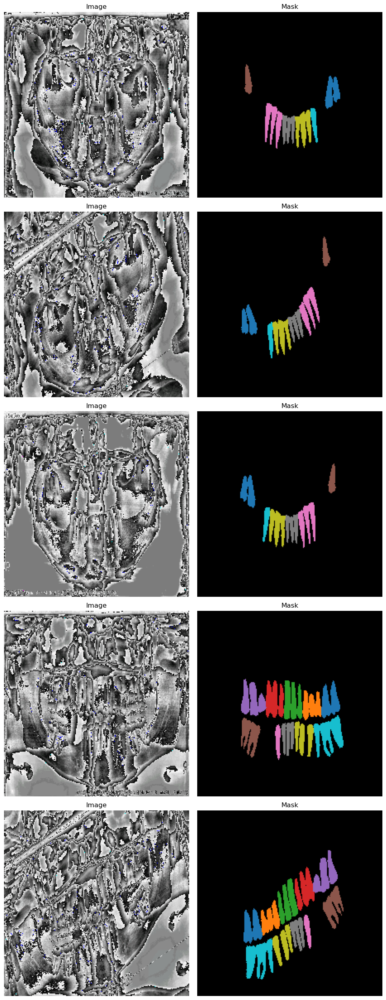

Sample 1, Augment 0: img shape = (224, 224), mask shape = (224, 224)
Sample 1, Augment 1: img shape = (224, 224), mask shape = (224, 224)
Sample 1, Augment 2: img shape = (224, 224), mask shape = (224, 224)
Sample 1, Augment 3: img shape = (224, 224), mask shape = (224, 224)
Sample 1, Augment 4: img shape = (224, 224), mask shape = (224, 224)


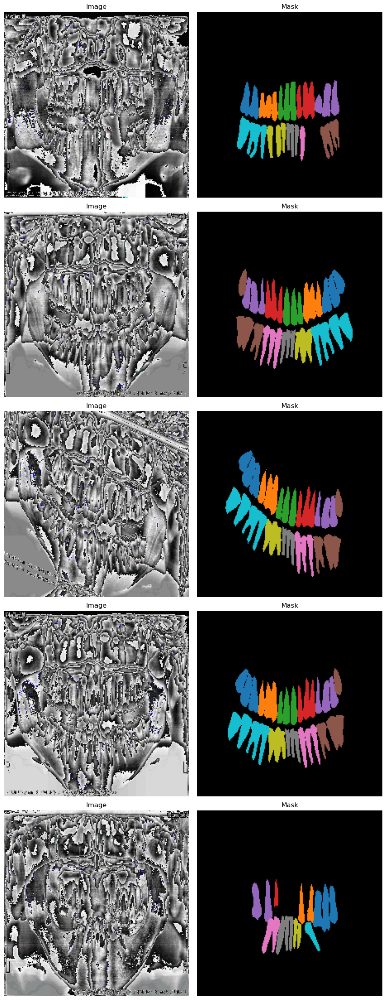

Sample 2, Augment 0: img shape = (224, 224), mask shape = (224, 224)
Sample 2, Augment 1: img shape = (224, 224), mask shape = (224, 224)
Sample 2, Augment 2: img shape = (224, 224), mask shape = (224, 224)
Sample 2, Augment 3: img shape = (224, 224), mask shape = (224, 224)
Sample 2, Augment 4: img shape = (224, 224), mask shape = (224, 224)


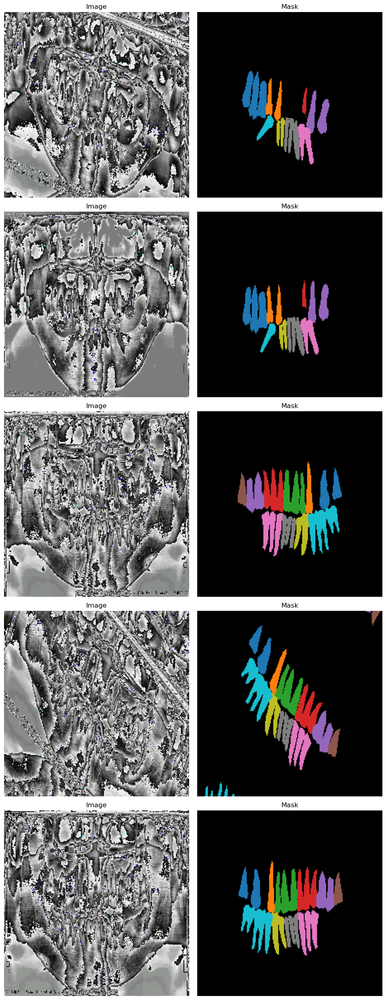

Sample 3, Augment 0: img shape = (224, 224), mask shape = (224, 224)
Sample 3, Augment 1: img shape = (224, 224), mask shape = (224, 224)
Sample 3, Augment 2: img shape = (224, 224), mask shape = (224, 224)
Sample 3, Augment 3: img shape = (224, 224), mask shape = (224, 224)
Sample 3, Augment 4: img shape = (224, 224), mask shape = (224, 224)


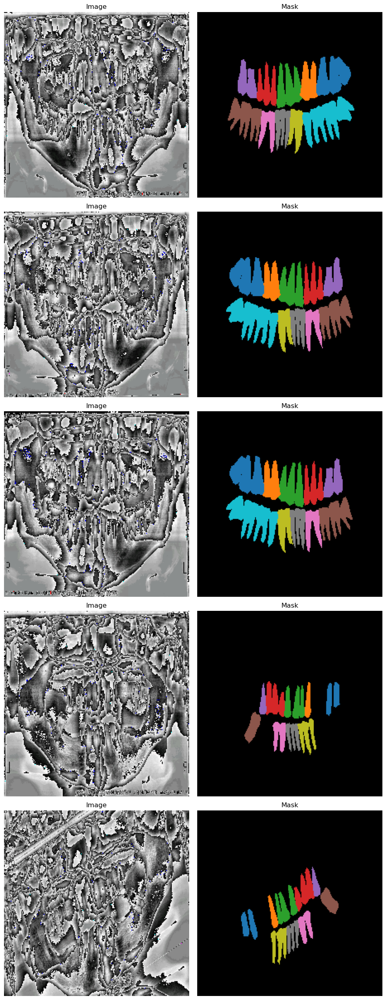

Sample 4, Augment 0: img shape = (224, 224), mask shape = (224, 224)
Sample 4, Augment 1: img shape = (224, 224), mask shape = (224, 224)
Sample 4, Augment 2: img shape = (224, 224), mask shape = (224, 224)
Sample 4, Augment 3: img shape = (224, 224), mask shape = (224, 224)
Sample 4, Augment 4: img shape = (224, 224), mask shape = (224, 224)


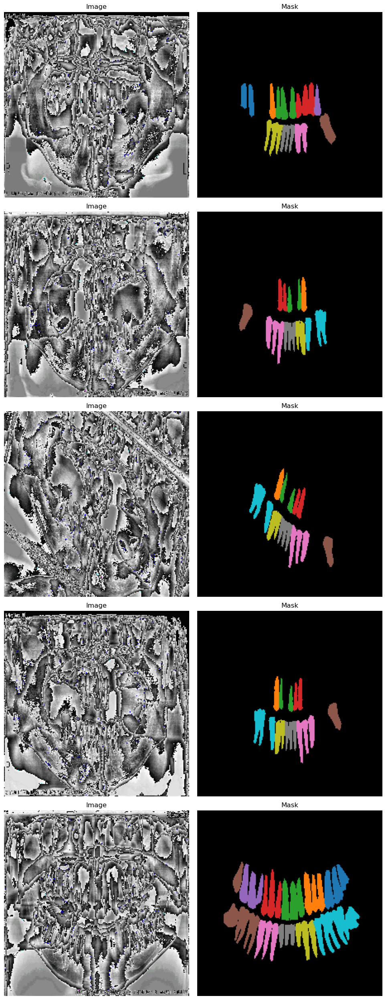

In [2]:
import torch
from torch.utils.data import DataLoader
from dataloader import CustomImageDataset, visualize_dataset # 모듈에서 불러오기

annotation_dir = "Teeth Segmentation JSON/d2/ann/train"
img_dir = "Teeth Segmentation JSON/d2/img/train"

# 데이터셋 생성
train_dataset = CustomImageDataset(annotation_dir, img_dir, apply_augmentation=True)

apply_augmentation = True

train_dataset = CustomImageDataset(annotation_dir, img_dir, apply_augmentation=apply_augmentation, augmentation_factor=3)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)

# Visualize some samples
visualize_dataset(train_dataset, num_samples=5, num_augments=5)

In [3]:
for images, masks in train_loader:
    print(f'Images shape: {images.shape}')
    print(f'Masks shape: {masks.shape}')
    break  # 첫 번째 배치만 확인

Images shape: torch.Size([16, 3, 224, 224])
Masks shape: torch.Size([16, 224, 224])


In [4]:
import torch
from torch.utils.data import DataLoader
from dataloader import CustomImageDataset, visualize_dataset

train_annotation_dir = os.path.abspath("Teeth Segmentation JSON/d2/ann/train")
train_img_dir = os.path.abspath("Teeth Segmentation JSON/d2/img/train")
val_annotation_dir = os.path.abspath("Teeth Segmentation JSON/d2/ann/val")
val_img_dir = os.path.abspath("Teeth Segmentation JSON/d2/img/val")
test_annotation_dir = os.path.abspath("Teeth Segmentation JSON/d2/ann/test")
test_img_dir = os.path.abspath("Teeth Segmentation JSON/d2/img/test")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def custom_collate_fn(batch):
    images = torch.stack([item[0] for item in batch])
    masks = torch.stack([item[1] for item in batch])
    return images, masks

apply_augmentation = True

train_dataset = CustomImageDataset(annotation_dir, img_dir, apply_augmentation=apply_augmentation, augmentation_factor=5)
val_dataset = CustomImageDataset(val_annotation_dir, val_img_dir, apply_augmentation=False, augmentation_factor=1)
test_dataset = CustomImageDataset(test_annotation_dir, test_img_dir, apply_augmentation=False, augmentation_factor=1)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=custom_collate_fn)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, collate_fn=custom_collate_fn)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, collate_fn=custom_collate_fn)


print(len(train_dataset))
print(len(val_dataset))
print(len(test_dataset))

2390
58
55


# Model Preparation

In [5]:
from numba import cuda

#device = cuda.get_current_device(); device.reset()

In [6]:
import os
import torch
import torch.nn as nn
import timm
from torch.utils.data import DataLoader
from dataloader import CustomImageDataset, visualize_dataset
from trainer import Trainer, set_seed, calculate_metrics, MDiceLoss, HybridLoss

from deepUNET import deepUNET
from UNETplusplus import UNetPlusPlus
#from SwinUNET import SwinEncoder, SwinUNet
#from UNET import UNET
#from AttentionUNET import AttentionUNET
#from efficientunet import *

set_seed(42)

#swin_model = timm.create_model('swin_large_patch4_window7_224', pretrained=True)
#swin_encoder = SwinEncoder(swin_model)
#model = SwinUNet(swin_encoder, num_classes=33).to(device)
#model = UNET(in_channels=3, out_channels=33).to(device)
#b7unet = get_efficientunet_b7(out_channels=33, concat_input=True, pretrained=True)
#model = b7unet.to(device)
#model = AttentionUNET(in_channels=3, out_channels=33).to(device)
#model = UNetPlusPlus(in_channels=3, out_channels=33, features=[64, 128, 256, 512]).to(device)

model = deepUNET(in_channels=3, out_channels=33, features=[64, 128, 256, 512]).to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=0.1)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10)

base_loss = nn.CrossEntropyLoss()
mdice_loss = MDiceLoss(num_classes=33)
criterion = HybridLoss(base_loss, mdice_loss, alpha=0.5)

trainer = Trainer(model, train_loader, val_loader, test_loader, criterion, optimizer, device, scheduler=scheduler)
trainer.train(num_epochs=1000, patience=30)
trainer.test()
trainer.plot_metrics()


Epoch [1/500]: 100%|██████████| 299/299 [21:35<00:00,  4.33s/it]


Epoch [1/1000], Train Loss: 0.5686, Val Loss: 0.4061, Dice: 0.4473, IoU: 0.3157


Epoch [2/500]: 100%|██████████| 299/299 [21:52<00:00,  4.39s/it]


Epoch [2/1000], Train Loss: 0.2783, Val Loss: 0.4094, Dice: 0.4575, IoU: 0.3261


Epoch [3/500]: 100%|██████████| 299/299 [26:05<00:00,  5.24s/it]


Epoch [3/1000], Train Loss: 0.2172, Val Loss: 0.1673, Dice: 0.7994, IoU: 0.6735


Epoch [4/500]: 100%|██████████| 299/299 [21:14<00:00,  4.26s/it]


Epoch [4/1000], Train Loss: 0.1839, Val Loss: 0.1659, Dice: 0.8018, IoU: 0.6787


Epoch [5/500]: 100%|██████████| 299/299 [23:30<00:00,  4.72s/it]


Epoch [5/1000], Train Loss: 0.1663, Val Loss: 0.1495, Dice: 0.8211, IoU: 0.7042


Epoch [6/500]: 100%|██████████| 299/299 [28:37<00:00,  5.74s/it]


Epoch [6/1000], Train Loss: 0.1585, Val Loss: 0.1491, Dice: 0.8214, IoU: 0.7058


Epoch [7/500]: 100%|██████████| 299/299 [29:00<00:00,  5.82s/it]


Epoch [7/1000], Train Loss: 0.1524, Val Loss: 0.1425, Dice: 0.8303, IoU: 0.7174


Epoch [8/500]: 100%|██████████| 299/299 [29:00<00:00,  5.82s/it]


Epoch [8/1000], Train Loss: 0.1429, Val Loss: 0.1563, Dice: 0.8150, IoU: 0.6986


Epoch [9/500]: 100%|██████████| 299/299 [28:47<00:00,  5.78s/it]


Epoch [9/1000], Train Loss: 0.1344, Val Loss: 0.1346, Dice: 0.8386, IoU: 0.7289


Epoch [10/500]: 100%|██████████| 299/299 [28:19<00:00,  5.68s/it]


Epoch [10/1000], Train Loss: 0.1286, Val Loss: 0.1657, Dice: 0.8040, IoU: 0.6821


Epoch [11/500]: 100%|██████████| 299/299 [28:59<00:00,  5.82s/it]


Epoch [11/1000], Train Loss: 0.1399, Val Loss: 0.1692, Dice: 0.7937, IoU: 0.6716


Epoch [12/500]: 100%|██████████| 299/299 [29:00<00:00,  5.82s/it]


Epoch [12/1000], Train Loss: 0.1330, Val Loss: 0.1410, Dice: 0.8323, IoU: 0.7208


Epoch [13/500]: 100%|██████████| 299/299 [29:01<00:00,  5.83s/it]


Epoch [13/1000], Train Loss: 0.1222, Val Loss: 0.1469, Dice: 0.8292, IoU: 0.7155


Epoch [14/500]: 100%|██████████| 299/299 [29:01<00:00,  5.82s/it]


Epoch [14/1000], Train Loss: 0.1308, Val Loss: 0.1393, Dice: 0.8364, IoU: 0.7269


Epoch [15/500]: 100%|██████████| 299/299 [29:00<00:00,  5.82s/it]


Epoch [15/1000], Train Loss: 0.1136, Val Loss: 0.1452, Dice: 0.8280, IoU: 0.7142


Epoch [16/500]: 100%|██████████| 299/299 [29:01<00:00,  5.82s/it]


Epoch [16/1000], Train Loss: 0.1105, Val Loss: 0.1355, Dice: 0.8382, IoU: 0.7289


Epoch [17/500]: 100%|██████████| 299/299 [23:50<00:00,  4.78s/it]


Epoch [17/1000], Train Loss: 0.1082, Val Loss: 0.1600, Dice: 0.8109, IoU: 0.6931


Epoch [18/500]: 100%|██████████| 299/299 [15:04<00:00,  3.03s/it]


Epoch [18/1000], Train Loss: 0.1144, Val Loss: 0.1482, Dice: 0.8295, IoU: 0.7169


Epoch [19/500]: 100%|██████████| 299/299 [15:04<00:00,  3.03s/it]


Epoch [19/1000], Train Loss: 0.1063, Val Loss: 0.1432, Dice: 0.8352, IoU: 0.7252


Epoch [20/500]: 100%|██████████| 299/299 [15:04<00:00,  3.03s/it]


Epoch [20/1000], Train Loss: 0.1042, Val Loss: 0.1433, Dice: 0.8336, IoU: 0.7231


Epoch [21/500]: 100%|██████████| 299/299 [15:04<00:00,  3.02s/it]


Epoch [21/1000], Train Loss: 0.0927, Val Loss: 0.1393, Dice: 0.8436, IoU: 0.7371


Epoch [22/500]: 100%|██████████| 299/299 [15:03<00:00,  3.02s/it]


Epoch [22/1000], Train Loss: 0.0882, Val Loss: 0.1380, Dice: 0.8457, IoU: 0.7402


Epoch [23/500]: 100%|██████████| 299/299 [15:03<00:00,  3.02s/it]


Epoch [23/1000], Train Loss: 0.0870, Val Loss: 0.1448, Dice: 0.8394, IoU: 0.7309


Epoch [24/500]: 100%|██████████| 299/299 [15:04<00:00,  3.03s/it]


Epoch [24/1000], Train Loss: 0.0861, Val Loss: 0.1376, Dice: 0.8447, IoU: 0.7385


Epoch [25/500]: 100%|██████████| 299/299 [15:17<00:00,  3.07s/it]


Epoch [25/1000], Train Loss: 0.0858, Val Loss: 0.1412, Dice: 0.8435, IoU: 0.7371


Epoch [26/500]: 100%|██████████| 299/299 [28:19<00:00,  5.68s/it]


Epoch [26/1000], Train Loss: 0.0841, Val Loss: 0.1445, Dice: 0.8392, IoU: 0.7307


Epoch [27/500]: 100%|██████████| 299/299 [20:45<00:00,  4.17s/it]


Epoch [27/1000], Train Loss: 0.0839, Val Loss: 0.1438, Dice: 0.8413, IoU: 0.7342


Epoch [28/500]: 100%|██████████| 299/299 [15:03<00:00,  3.02s/it]


Epoch [28/1000], Train Loss: 0.0837, Val Loss: 0.1486, Dice: 0.8328, IoU: 0.7204


Epoch [29/500]: 100%|██████████| 299/299 [15:03<00:00,  3.02s/it]


Epoch [29/1000], Train Loss: 0.0829, Val Loss: 0.1401, Dice: 0.8435, IoU: 0.7371


Epoch [30/500]: 100%|██████████| 299/299 [15:03<00:00,  3.02s/it]


Epoch [30/1000], Train Loss: 0.0798, Val Loss: 0.1388, Dice: 0.8470, IoU: 0.7426


Epoch [31/500]: 100%|██████████| 299/299 [15:04<00:00,  3.02s/it]


Epoch [31/1000], Train Loss: 0.0797, Val Loss: 0.1420, Dice: 0.8429, IoU: 0.7359


Epoch [32/500]: 100%|██████████| 299/299 [15:03<00:00,  3.02s/it]


Epoch [32/1000], Train Loss: 0.0747, Val Loss: 0.1418, Dice: 0.8452, IoU: 0.7394


Epoch [33/500]: 100%|██████████| 299/299 [15:15<00:00,  3.06s/it]


Epoch [33/1000], Train Loss: 0.0722, Val Loss: 0.1445, Dice: 0.8437, IoU: 0.7371


Epoch [34/500]:  19%|█▉        | 58/299 [03:10<17:22,  4.33s/it]

Post processing

In [ ]:
import torch
import torch.nn.functional as F
from skimage.morphology import dilation, erosion, square, disk, diamond

def evaluate_model(loader, model, device, operation=None, selem_size=3):
    model.eval()
    total_dice = 0.0
    total_iou = 0.0
    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device)
            masks = masks.squeeze(1).to(device, dtype=torch.long)
            predictions = model(images)
            preds_argmax = torch.argmax(predictions, dim=1)
            if operation:
                preds_argmax = apply_morphology(preds_argmax.cpu(), operation, selem_size).to(device)
            dice, iou = calculate_metrics(preds_argmax, masks, num_classes=34)
            total_dice += dice
            total_iou += iou
        avg_dice = total_dice / len(loader)
        avg_iou = total_iou / len(loader)
    return avg_dice, avg_iou

def one_hot_encode(tensor, num_classes):
    # Ensure the tensor is in the shape [batch_size, height, width] before one-hot encoding
    if tensor.dim() == 2:
        tensor = tensor.unsqueeze(0)  # Add batch dimension if missing
    tensor = F.one_hot(tensor, num_classes=num_classes)  # Expected shape [batch_size, height, width, classes]
    return tensor.permute(0, 3, 1, 2).float()  # Permute to [batch_size, classes, height, width]

def calculate_metrics(pred, target, num_classes=34, epsilon=1e-6):
    pred_one_hot = one_hot_encode(pred, num_classes)
    target_one_hot = one_hot_encode(target, num_classes)
    intersection = (pred_one_hot * target_one_hot).sum(dim=(0, 2, 3))
    union = pred_one_hot.sum(dim=(0, 2, 3)) + target_one_hot.sum(dim=(0, 2, 3))
    dice_score = (2. * intersection + epsilon) / (union + epsilon)
    iou_score = (intersection + epsilon) / (union - intersection + epsilon)
    return dice_score.mean().item(), iou_score.mean().item()

def apply_morphology(mask, operation, selem_size=3):
    selem = square(selem_size)
    processed_mask = []

    if operation == 'dilation_then_erosion':
        for m in mask:
            m_dilated = dilation(m.numpy(), selem)
            m_eroded = erosion(m_dilated, selem)
            processed_mask.append(m_eroded)
    elif operation == 'erosion_then_dilation':
        for m in mask:
            m_eroded = erosion(m.numpy(), selem)
            m_dilated = dilation(m_eroded, selem)
            processed_mask.append(m_dilated)
    else:
        raise ValueError("Unsupported operation specified")
    
    return torch.tensor(processed_mask, dtype=torch.long)

# 모폴로지 'Opening' 연산 적용 후 평가
avg_dice_opening, avg_iou_opening = evaluate_model(test_loader, model, device, 'dilation_then_erosion', 3)
print(f'Opening mDice: {avg_dice_opening}, Opening IoU: {avg_iou_opening}')

# 모폴로지 'Closing' 연산 적용 후 평가
avg_dice_closing, avg_iou_closing = evaluate_model(test_loader, model, device, 'erosion_then_dilation', 3)
print(f'Closing mDice: {avg_dice_closing}, Closing IoU: {avg_iou_closing}')

#efficientUnetb7


C:\Users\wnejd\AppData\Local\Temp\ipykernel_37320\3396340686.py:57: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:277.)
  return torch.tensor(processed_mask, dtype=torch.long)


Opening mDice: 0.8395271301269531, Opening IoU: 0.7295052664620536
Closing mDice: 0.8593610014234271, Closing IoU: 0.7595905831881932


Image 0 - shape: torch.Size([224, 224, 3]), max: 2.6068992614746094, min: 0.49827173352241516
After normalization - Image 0 - max: 1.0, min: 0.0
Image 1 - shape: torch.Size([224, 224, 3]), max: 2.6068992614746094, min: 0.4977591335773468
After normalization - Image 1 - max: 1.0, min: 0.0
Image 2 - shape: torch.Size([224, 224, 3]), max: 2.6068992614746094, min: 0.50154709815979
After normalization - Image 2 - max: 1.0, min: 0.0


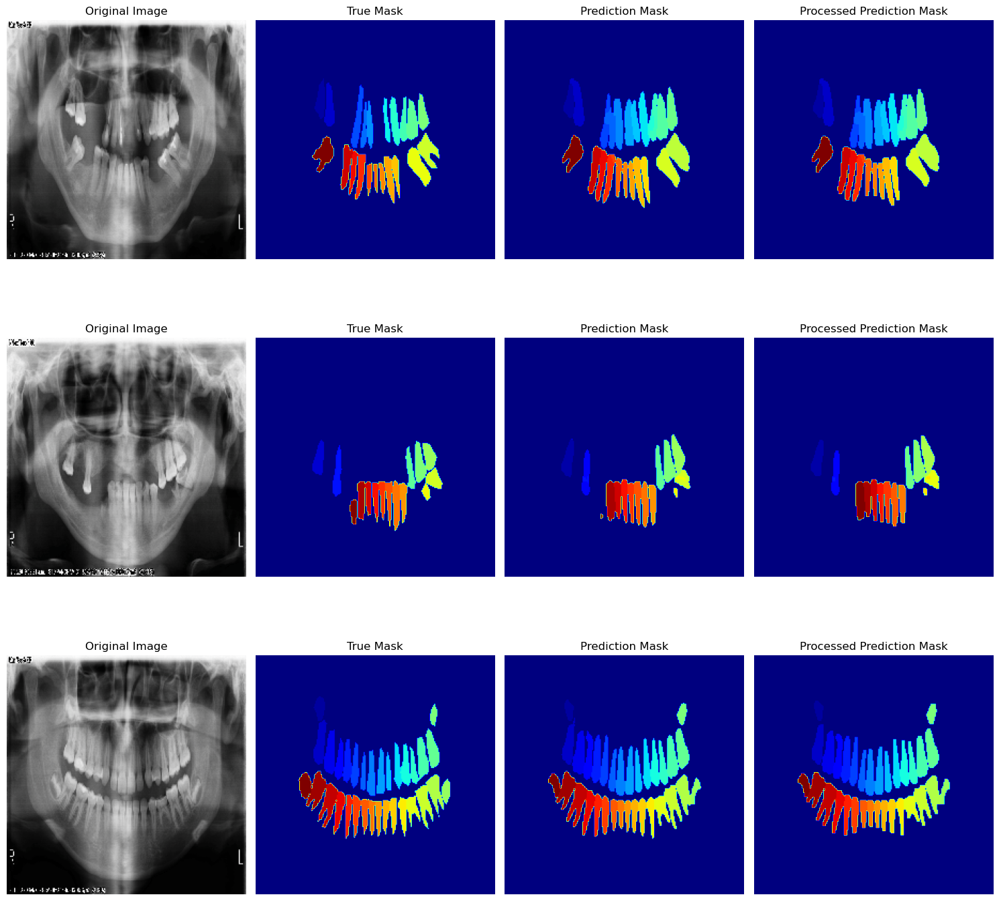

In [ ]:
import matplotlib.pyplot as plt
import torch

def plot_comparison(images, true_masks, preds_argmax, processed_preds, num_images=3):
    fig, axs = plt.subplots(num_images, 4, figsize=(15, 5 * num_images))
    for i in range(num_images):
        # Ensure the image has shape [224, 224, 3]
        image = images[i].cpu().permute(1, 2, 0)
        
        print(f"Image {i} - shape: {image.shape}, max: {image.max()}, min: {image.min()}")
        
        # Normalize the image if necessary
        if image.max() > 1:
            image = (image - image.min()) / (image.max() - image.min())
            print(f"After normalization - Image {i} - max: {image.max()}, min: {image.min()}")
        
        # Display the original image
        axs[i, 0].imshow(image)
        axs[i, 0].set_title('Original Image')
        axs[i, 0].axis('off')

        # Display the true mask
        axs[i, 1].imshow(true_masks[i].cpu(), cmap='jet')
        axs[i, 1].set_title('True Mask')
        axs[i, 1].axis('off')

        # Display the prediction mask
        axs[i, 2].imshow(preds_argmax[i].cpu(), cmap='jet')
        axs[i, 2].set_title('Prediction Mask')
        axs[i, 2].axis('off')

        # Display the processed prediction mask
        axs[i, 3].imshow(processed_preds[i].cpu(), cmap='jet')
        axs[i, 3].set_title('Processed Prediction Mask')
        axs[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

# Choose a single batch from the test_loader
test_iter = iter(test_loader)
images, masks = next(test_iter)
images = images.to(device)
masks = masks.squeeze(1)  # Remove channel dim if present, for visualization

# Get model predictions
model.eval()
with torch.no_grad():
    predictions = model(images)
    preds_argmax = torch.argmax(predictions, dim=1)

# Apply postprocessing
processed_preds = apply_morphology(preds_argmax.cpu(), 'erosion_then_dilation', 3).to(device)

# Visualization
plot_comparison(images, masks, preds_argmax, processed_preds, num_images=3)
